<a href="https://colab.research.google.com/github/1920039/-Keras-study/blob/main/13_funtopics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

실습파일: `13-funtopics.ipynb`

# Adversarial attack

In [1]:
%tensorflow_version 2.x       # GAN 실습 시에는 1.x를 사용

`%tensorflow_version` only switches the major version: 1.x or 2.x.
You set: `2.x       # GAN 실습 시에는 1.x를 사용`. This will be interpreted as: `2.x`.


TensorFlow 2.x selected.


**Fast Gradient Signed Method(이외에도 많은 방법 있음)**

In [2]:
import tensorflow as tf
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams['figure.figsize'] = (8, 8)
mpl.rcParams['axes.grid'] = False


**MobileNetV2를 네트워크로 이용**  
ImageNet에서 사전 훈련된 weights 사용

In [3]:
pretrained_model = tf.keras.applications.MobileNetV2(include_top=True,
                                                     weights='imagenet')
pretrained_model.trainable = False   # 학습시키지 않고 결과만 이용할 것임

# ImageNet 클래스 레이블
decode_predictions = tf.keras.applications.mobilenet_v2.decode_predictions  # 출력된 결과를 해석할 수 있도록 라벨 등의 정보 있음

14548992/14536120 [==============================] - 0s 0us/step


In [4]:
# 이미지가 MobileNetV2에 사용하기 위한 level normalization 및 size normalization 함수
def preprocess(image):
  image = tf.cast(image, tf.float32)
  image = image/255
  image = tf.image.resize(image, (224, 224))   #모바일넷 v2의 기본 크기
  image = image[None, ...]
  return image

# 예측 결과로부터 top1을 뽑아서 라벨을 출력하는 함수
def get_imagenet_label(probs):
  return decode_predictions(probs, top=1)[0][0]

**정상적으로 인식되는 이미지 샘플 다운로드**

In [5]:
image_path = tf.keras.utils.get_file('YellowLabradorLooking_new.jpg', 'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg')
image_raw = tf.io.read_file(image_path)
image = tf.image.decode_image(image_raw)

image = preprocess(image)
image_probs = pretrained_model.predict(image)

98304/83281 [===================================] - 0s 0us/step


In [6]:
image_probs.shape       # 클래스가 1000개임

(1, 1000)

49152/35363 [=========================================] - 0s 0us/step


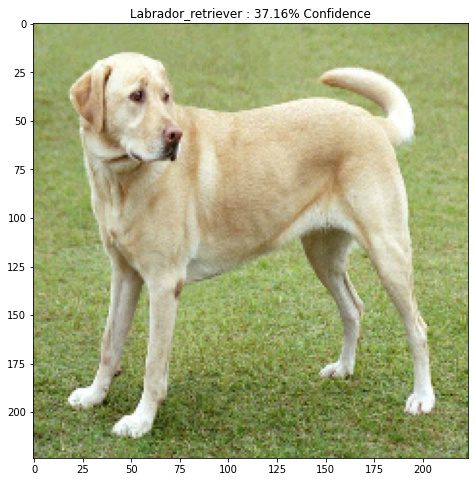

In [7]:
plt.figure()
plt.imshow(image[0])
_, image_class, class_confidence = get_imagenet_label(image_probs)
plt.title('{} : {:.2f}% Confidence'.format(image_class, class_confidence*100))
plt.show()


**FGSM으로 공격 패턴 만들기**
1. GradientTape으로 미분 추적기능 활성화  
2. input_image에 대한 미분만 추적 (`tape.watch(input_image)`)  
3. 모델에 입력영상을 넣고, prediction 수행  
4. Ground truth(`input_label`)와, 예측치(`prediction`)간의 교차 엔트로피를 `loss`로 계산  
5. `loss`를 `input_image`에 대해 미분(gradient)한 것에 대한 결과:  
   `gradient` 
6. Gradient에 대한 부호값만 `signed_grad`에 저장하고 반환  

In [9]:
from tensorflow import keras
loss_object = keras.losses.CategoricalCrossentropy()

def create_adversarial_pattern(input_image, input_label):
  with tf.GradientTape() as tape:
    tape.watch(input_image)
    prediction = pretrained_model(input_image)
    loss = loss_object(input_label, prediction)   # 왜 직접 사용하지 않고 obj를 만들어 사용할까?

  # 입력 이미지에 대한 손실 함수의 기울기를 구합니다.
  gradient = tape.gradient(loss, input_image)
  # 왜곡을 생성하기 위해 그래디언트의 부호를 구합니다.
  signed_grad = tf.sign(gradient)           # hence the name!!
  return signed_grad

1. 래브라도 리트리버 class에 대한 ground truth data('label') 생성  
2. 위에서 정의한 공격 패턴 생성 함수 호출    

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


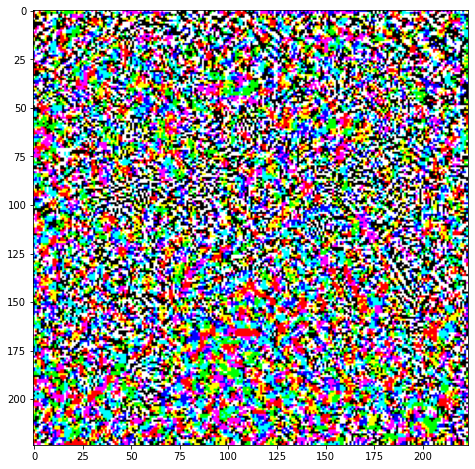

In [10]:
# 이미지의 레이블 위치만 1로 설정 (기본적인 클래스 분류기 결과)
labrador_retriever_index = 208     # 클래스 0~999 중 208임
label = tf.one_hot(labrador_retriever_index, image_probs.shape[-1])    #image_probs.shape[-1]은 1000
label = tf.reshape(label, (1, image_probs.shape[-1]))

# 공격 패턴 생성
perturbations = create_adversarial_pattern(image, label)   # perturbation 동요, 작은 변화
plt.imshow(perturbations[0])            # 이미지에 대한 gradient의 +, - 부호값만 가져옴
plt.show()

**공격 패턴을 적용하고 이미지 및 결과를 출력해주는 함수 정의**

In [11]:
# 인식하고 이미지 출력
def display_images(image, description):
  _, label, confidence = get_imagenet_label(pretrained_model.predict(image))
  plt.figure()
  plt.imshow(image[0])
  plt.title('{} \n {} : {:.2f}% Confidence'.format(description,
                                                   label, confidence*100))
  plt.show()


**Scale factor인 $\epsilon$을 서서히 증가시키면서 공격 결과 관측**

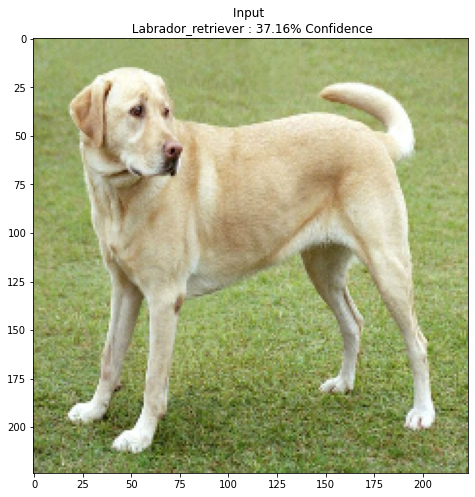

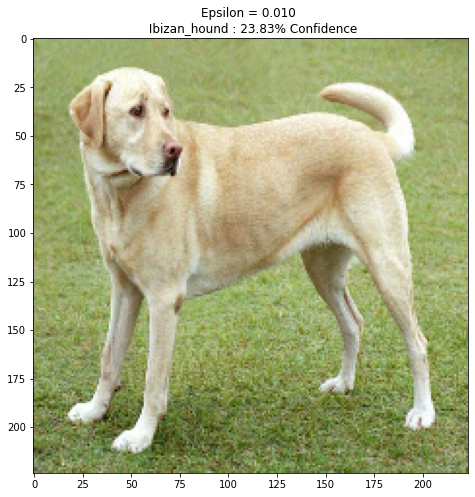

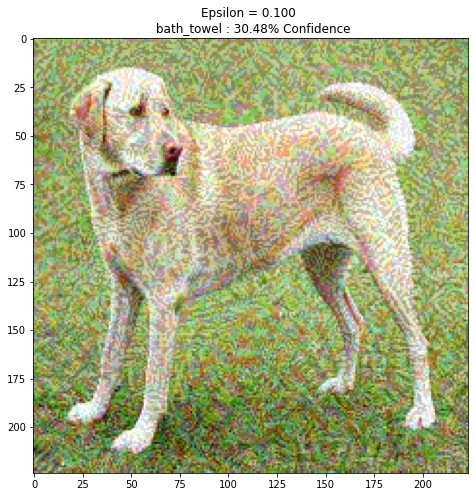

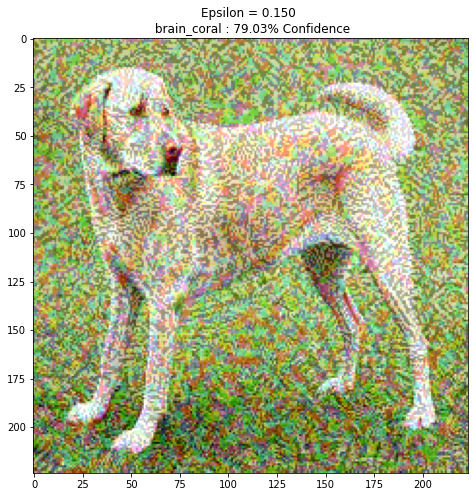

In [12]:
# epsilon을 변경하면서 결과 관찰
epsilons = [0, 0.01, 0.1, 0.15]
descriptions = [('Epsilon = {:0.3f}'.format(eps) if eps else 'Input')
                for eps in epsilons]

for i, eps in enumerate(epsilons):
  adv_x = image + eps*perturbations
  adv_x = tf.clip_by_value(adv_x, 0, 1)
  display_images(adv_x, descriptions[i])

# StyleGAN

StyleGAN 소스 코드: 

**주의 사항**  
StyleGAN은 tensorflow 1.x 버전 소스입니다.  
런타임 -> 런타임 다시 시작을 선택하신 후 StyleGAN 부분부터 실행합니다. 

In [1]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


StyleGAN repo 복사(엔비디아 연구소)

In [3]:
!git clone https://github.com/NVlabs/stylegan2.git 

Cloning into 'stylegan2'...
remote: Enumerating objects: 138, done.
remote: Counting objects: 100% (11/11), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 138 (delta 4), reused 10 (delta 4), pack-reused 127
Receiving objects: 100% (138/138), 599.47 KiB | 2.38 MiB/s, done.
Resolving deltas: 100% (62/62), done.


**명령어로 StyleGan 실행**

In [5]:
!python /content/stylegan2/run_generator.py generate-images \
    --network=gdrive:networks/stylegan2-ffhq-config-f.pkl \
  --seeds=6600-6625 --truncation-psi=0.5

Local submit - run_dir: results/00001-generate-images
dnnlib: Running run_generator.generate_images() on localhost...
Loading networks from "gdrive:networks/stylegan2-ffhq-config-f.pkl"...
2021-12-08 09:11:38.603743: E tensorflow/stream_executor/cuda/cuda_driver.cc:318] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Failed!
Traceback (most recent call last):
  File "/content/stylegan2/run_generator.py", line 168, in <module>
    main()
  File "/content/stylegan2/run_generator.py", line 163, in main
    dnnlib.submit_run(sc, func_name_map[subcmd], **kwargs)
  File "/content/stylegan2/dnnlib/submission/submit.py", line 343, in submit_run
    return farm.submit(submit_config, host_run_dir)
  File "/content/stylegan2/dnnlib/submission/internal/local.py", line 22, in submit
    return run_wrapper(submit_config)
  File "/content/stylegan2/dnnlib/submission/submit.py", line 280, in run_wrapper


In [ ]:
!ls /content/results/00000-generate-images

_finished.txt  seed6604.png  seed6611.png  seed6618.png  seed6625.png
log.txt        seed6605.png  seed6612.png  seed6619.png  submit_config.pkl
run.txt        seed6606.png  seed6613.png  seed6620.png  submit_config.txt
seed6600.png   seed6607.png  seed6614.png  seed6621.png
seed6601.png   seed6608.png  seed6615.png  seed6622.png
seed6602.png   seed6609.png  seed6616.png  seed6623.png
seed6603.png   seed6610.png  seed6617.png  seed6624.png


In [ ]:
!mkdir -p /content/drive/My\ Drive/projects/stylegan2

In [ ]:
cp /content/results/00000-generate-images/* \
    /content/drive/My\ Drive/projects/stylegan2

# 파이썬으로 StyleGAN2 실행하기

StyleGAN 폴더를 파이썬에 추가해서, 폴더를 이동하지 않고도 import하도록 함.  

In [ ]:
import sys
sys.path.insert(0, "/content/stylegan2")      # system path에 추가

import dnnlib

**본 소스 코드의 저작권은 NVIDIA에게 있습니다.**  
사용에 대한 제한 조건에 대해서는 아래의 링크를 참조하세요.  
https://nvlabs.github.io/stylegan2/license.html  


In [ ]:
# Copyright (c) 2019, NVIDIA Corporation. All rights reserved.
#
# This work is made available under the Nvidia Source Code License-NC.
# To view a copy of this license, visit
# https://nvlabs.github.io/stylegan2/license.html

import argparse
import numpy as np
import PIL.Image
import dnnlib
import dnnlib.tflib as tflib
import re
import sys

import pretrained_networks

#----------------------------------------------------------------------------
# 시드로부터 랜덤 넘버 생성  
# vector_size: 512 차원(512차원의 random variable이 있음. 재현의 동일성 확보. 
# 과거에는 random seed 쓰다가, 요즘은 시간을 사용하는 random variable로 바뀜)

def expand_seed(seeds, vector_size):   # 주요한 부분: z 생성  
  result = []

  for seed in seeds:
    rnd = np.random.RandomState(seed)
    result.append( rnd.randn(1, vector_size) ) 
  return result

def generate_images(Gs, seeds, truncation_psi):    # generator
    noise_vars = [var for name, var in \
                  Gs.components.synthesis.vars.items() \
                  if name.startswith('noise')]

    Gs_kwargs = dnnlib.EasyDict()
    Gs_kwargs.output_transform = dict(func= \
        tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    Gs_kwargs.randomize_noise = False
    if truncation_psi is not None:
        Gs_kwargs.truncation_psi = truncation_psi

    for seed_idx, seed in enumerate(seeds):
        print('Generating image for seed %d/%d ...' % (seed_idx, len(seeds)))
        rnd = np.random.RandomState()
        tflib.set_vars({var: rnd.randn(*var.shape.as_list()) \
                        for var in noise_vars}) # [height, width]
        images = Gs.run(seed, None, **Gs_kwargs) 
        # [minibatch, height, width, channel]
        path = f"/content/drive/My Drive/projects/"+\
                f"stylegan2/image{seed_idx}.png"
        PIL.Image.fromarray(images[0], 'RGB').save(path)

def main():
    sc = dnnlib.SubmitConfig()
    sc.num_gpus = 1
    sc.submit_target = dnnlib.SubmitTarget.LOCAL
    sc.local.do_not_copy_source_files = True
    sc.run_dir_root = "/content/drive/My Drive/projects/stylegan2"
    sc.run_desc = 'generate-images'
    network_pkl = 'gdrive:networks/stylegan2-ffhq-config-f.pkl'

    print('Loading networks from "%s"...' % network_pkl)
    _G, _D, Gs = pretrained_networks.load_networks(network_pkl)
    vector_size = Gs.input_shape[1:][0]
    seeds = expand_seed( range(8040,8090), vector_size)    # 50개의 latent variable z를 생성. 이게 같으면 같은 얼굴이 생성됨
    generate_images(Gs, seeds,truncation_psi=0.5)

#----------------------------------------------------------------------------

if __name__ == "__main__":
    main()

#----------------------------------------------------------------------------

Loading networks from "gdrive:networks/stylegan2-ffhq-config-f.pkl"...
Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.
Generating image for seed 0/50 ...
Generating image for seed 1/50 ...
Generating image for seed 2/50 ...
Generating image for seed 3/50 ...
Generating image for seed 4/50 ...
Generating image for seed 5/50 ...
Generating image for seed 6/50 ...
Generating image for seed 7/50 ...
Generating image for seed 8/50 ...
Generating image for seed 9/50 ...
Generating image for seed 10/50 ...
Generating image for seed 11/50 ...
Generating image for seed 12/50 ...
Generating image for seed 13/50 ...
Generating image for seed 14/50 ...
Generating image for seed 15/50 ...
Generating image for seed 16/50 ...
Generating image for seed 17/50 ...
Generating image for seed 18/50 ...
Generating image for seed 19/50 ...
Generating image for seed 20/50 ...
Generating image fo

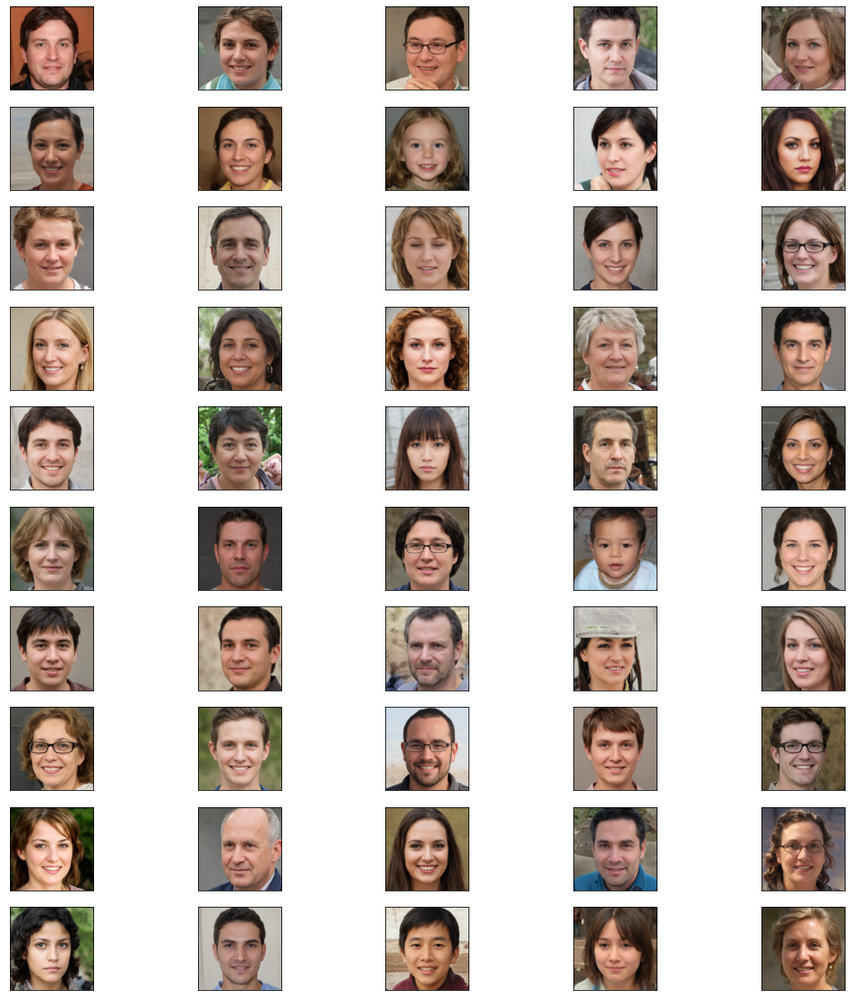

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mp_image

cols = 5
rows = 10

plt.figure(figsize=(18,20))
for j in range(rows):
  for i in range(cols):
    plt.subplot(rows, cols, i+j*cols+1)
    img = mp_image.imread('/content/drive/My Drive/projects/stylegan2/image%d.png' % (i+j*cols))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.show()

In [ ]:
# 2개의 랜덤 넘버(아래의 8087, 8088)를 모핑
sc = dnnlib.SubmitConfig()
sc.num_gpus = 1
sc.submit_target = dnnlib.SubmitTarget.LOCAL
sc.local.do_not_copy_source_files = True
sc.run_dir_root = "/content/drive/My Drive/projects/stylegan2"
sc.run_desc = 'generate-images'
network_pkl = 'gdrive:networks/stylegan2-ffhq-config-f.pkl'

print('Loading networks from "%s"...' % network_pkl)
_G, _D, Gs = pretrained_networks.load_networks(network_pkl)
vector_size = Gs.input_shape[1:][0]
# range(8192,8300)
start = 8448
#seeds = expand_seed( [8192+1,8192+9], vector_size)
seeds = expand_seed( [8087,8088], vector_size)

#generate_images(Gs, seeds,truncation_psi=0.5)
print(seeds[0].shape)

Loading networks from "gdrive:networks/stylegan2-ffhq-config-f.pkl"...
(1, 512)


In [ ]:
# 8192+1,8192+9

STEPS = 300    # 2개의 중간 이미지를 300장을 만듬
diff = seeds[1] - seeds[0]
step = diff / STEPS
current = seeds[0].copy()

seeds2 = []
for i in range(STEPS):
  seeds2.append(current)
  current = current + step

generate_images(Gs, seeds2,truncation_psi=0.5)

Generating image for seed 0/300 ...
Generating image for seed 1/300 ...
Generating image for seed 2/300 ...
Generating image for seed 3/300 ...
Generating image for seed 4/300 ...
Generating image for seed 5/300 ...
Generating image for seed 6/300 ...
Generating image for seed 7/300 ...
Generating image for seed 8/300 ...
Generating image for seed 9/300 ...
Generating image for seed 10/300 ...
Generating image for seed 11/300 ...
Generating image for seed 12/300 ...
Generating image for seed 13/300 ...
Generating image for seed 14/300 ...
Generating image for seed 15/300 ...
Generating image for seed 16/300 ...
Generating image for seed 17/300 ...
Generating image for seed 18/300 ...
Generating image for seed 19/300 ...
Generating image for seed 20/300 ...
Generating image for seed 21/300 ...
Generating image for seed 22/300 ...
Generating image for seed 23/300 ...
Generating image for seed 24/300 ...
Generating image for seed 25/300 ...
Generating image for seed 26/300 ...
Generating 

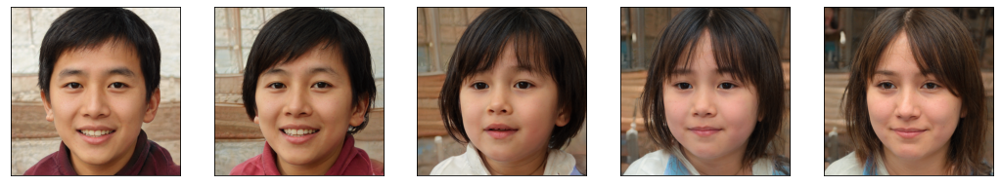

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mp_image

steps=STEPS
cols = 5
ids = []
for i in range(cols):
    id = np.floor(i*(steps-1)/(cols-1)).astype('int')
    ids.append(id)

plt.figure(figsize=(18,8))
for i in range(cols):
  plt.subplot(1, cols, i+1)
  img = mp_image.imread('/content/drive/My Drive/projects/stylegan2/image%d.png' % ids[i])
  plt.imshow(img)
  plt.xticks([])
  plt.yticks([])
plt.show()

In [ ]:
!ls '/content/drive/My Drive/projects/stylegan2'

_finished.txt  image15.png   image21.png   image280.png  image70.png
image0.png     image160.png  image220.png  image281.png  image71.png
image100.png   image161.png  image221.png  image282.png  image72.png
image101.png   image162.png  image222.png  image283.png  image73.png
image102.png   image163.png  image223.png  image284.png  image74.png
image103.png   image164.png  image224.png  image285.png  image75.png
image104.png   image165.png  image225.png  image286.png  image76.png
image105.png   image166.png  image226.png  image287.png  image77.png
image106.png   image167.png  image227.png  image288.png  image78.png
image107.png   image168.png  image228.png  image289.png  image79.png
image108.png   image169.png  image229.png  image28.png	 image7.png
image109.png   image16.png   image22.png   image290.png  image80.png
image10.png    image170.png  image230.png  image291.png  image81.png
image110.png   image171.png  image231.png  image292.png  image82.png
image111.png   image172.png  image23

In [ ]:
#!rm /content/drive/My\ Drive/projects/stylegan2/*.png

**스타일 믹싱**

col-seeds: 열 램덤 시드  
row-seeds: 행 랜덤 시드  
col의 스타일 ('0-6')을 row에 이식  


In [ ]:
!python /content/stylegan2/run_generator.py style-mixing-example \
    --network=gdrive:networks/stylegan2-ffhq-config-f.pkl \
    --row-seeds=85,100,75,458,1500 --col-seeds=55,821,1789,293 \
    --truncation-psi=1.0

    #--col-styles='0-6'  # 기본값이 0-6이며(안경, 헤어스타일이 옮겨옴), 다른 값으로 바꾸면 다른 특징(예. 피부색, 머리색)이 올겨옴

Local submit - run_dir: results/00001-style-mixing-example
dnnlib: Running run_generator.style_mixing_example() on localhost...
Loading networks from "gdrive:networks/stylegan2-ffhq-config-f.pkl"...
Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.
Generating W vectors...
Generating images...
2021-11-16 01:00:46.946182: W tensorflow/core/common_runtime/bfc_allocator.cc:305] Garbage collection: deallocate free memory regions (i.e., allocations) so that we can re-allocate a larger region to avoid OOM due to memory fragmentation. If you see this message frequently, you are running near the threshold of the available device memory and re-allocation may incur great performance overhead. You may try smaller batch sizes to observe the performance impact. Set TF_ENABLE_GPU_GARBAGE_COLLECTION=false if you'd like to disable this feature.
2021-11-16 01:00:47.105003: W tensorflow/core/

In [ ]:
!ls results

00000-generate-images  00001-style-mixing-example


In [ ]:
!ls /content/results/00001-style-mixing-example

100-100.png    1500-293.png   458-458.png  75-75.png	85-85.png
100-1789.png   1500-55.png    458-55.png   75-821.png	_finished.txt
100-293.png    1500-821.png   458-821.png  821-821.png	grid.png
100-55.png     1789-1789.png  55-55.png    85-1789.png	log.txt
100-821.png    293-293.png    75-1789.png  85-293.png	run.txt
1500-1500.png  458-1789.png   75-293.png   85-55.png	submit_config.pkl
1500-1789.png  458-293.png    75-55.png    85-821.png	submit_config.txt


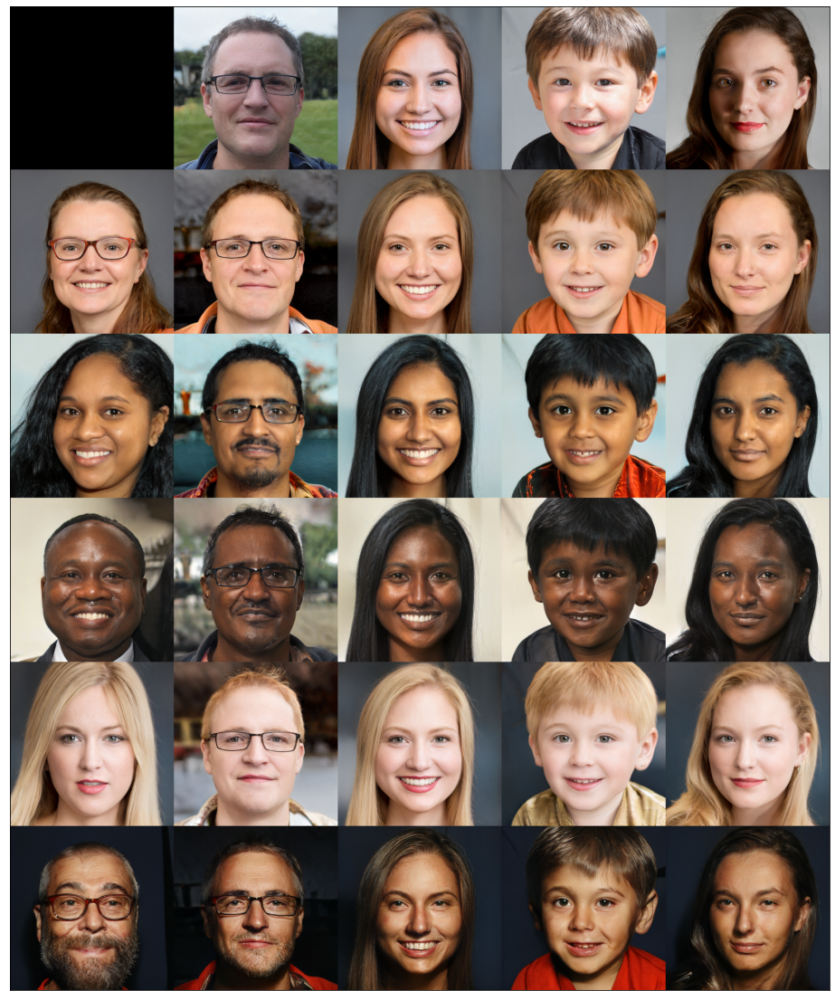

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mp_image
image = mp_image.imread('/content/results/00001-style-mixing-example/grid.png')
plt.figure(figsize=(20,20))
plt.imshow(image)
plt.xticks([])
plt.yticks([])
plt.show()

# 동영상 만들기(모핑에서 개별 사진으로부터 동영상을)

참조 노트북 파일:  
https://colab.research.google.com/github/yunooooo/FFmpeg-for-Google-Drive/blob/master/FFmpeg.ipynb

**ffmepg 설치**

In [ ]:
#@title <font size="5">← ឵឵<i>FFMPEG 설치</font> { vertical-output: true }
from IPython.display import clear_output
import os, urllib.request
HOME = os.path.expanduser("~")
pathDoneCMD = f'{HOME}/doneCMD.sh'
if not os.path.exists(f"{HOME}/.ipython/ttmg.py"):
    hCode = "https://raw.githubusercontent.com/yunooooo/gcct/master/res/ttmg.py"
    urllib.request.urlretrieve(hCode, f"{HOME}/.ipython/ttmg.py")

from ttmg import (
    loadingAn,
    textAn,
)

loadingAn(name="lds")
textAn("Installing Dependencies...", ty='twg')
os.system('pip install git+git://github.com/AWConant/jikanpy.git')
os.system('add-apt-repository -y ppa:jonathonf/ffmpeg-4')
os.system('apt-get update')
os.system('apt install mediainfo')
os.system('apt-get install ffmpeg')
clear_output()
print('Installation finished.')

Installation finished.


In [ ]:
!ffmpeg -r 30 -i '/content/drive/My Drive/projects/stylegan2/image%d.png' -y video.mp4

ffmpeg version 4.3.2-0york0~18.04 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version='0york0~18.04' --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab

만들어진 동영상의 재생

In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('video.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)